In [1]:
from pathlib import Path
import pandas as pd
import os
import shutil
import hashlib
import seaborn as sns
from IPython.display import display
from pytorch_grad_cam import GradCAM
import time

In [2]:
import sys
print(sys.executable)

/opt/anaconda3/envs/t3_project/bin/python


In [3]:
!{sys.executable} -m pip list | grep torch

torch                     2.4.1
torchvision               0.19.1


In [4]:
import torch

In [5]:
import torchvision
import matplotlib.pyplot as plt
import numpy as np

In [6]:
os.getcwd()
os.chdir("..")
os.getcwd()

'/Users/kalyanivenkateswaran/Documents/T3_Project/waste_classification'

In [7]:
BASE_DIR = Path.cwd()
META_DIR = BASE_DIR / "data" / "metadata"
file1=META_DIR/"consolidated_metatdata.csv"

In [8]:
metadata_df = pd.read_csv(file1)

In [9]:
stg2_meta_df = metadata_df.loc[~metadata_df['stage2_label'].isin(['Non_Organic','Organic'])]

In [10]:
stg2_meta_df

,filepath,stage1_label,stage2_label,source,type,split_key
31036,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean
31037,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean
31038,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean
31039,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean
31040,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean
...,...,...,...,...,...,...
67601,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean
67602,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean
67603,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean
67604,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean


In [2]:
stg2_meta_df['stage2_label'].value_counts()

NameError: name 'stg2_meta_df' is not defined

In [12]:
from sklearn.model_selection import train_test_split


train_df, temp_df = train_test_split(
    stg2_meta_df,
    test_size=0.30,          # 70 train / 30 temp
    stratify=stg2_meta_df["stage2_label"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,          # 15 / 15
    stratify=temp_df["stage2_label"],
    random_state=42
)

In [13]:
stg2_meta_df.loc[stg2_meta_df["filepath"].isin(train_df["filepath"]), "split"] = "train"
stg2_meta_df.loc[stg2_meta_df["filepath"].isin(test_df["filepath"]), "split"] = "test"
stg2_meta_df.loc[stg2_meta_df["filepath"].isin(val_df["filepath"]), "split"] = "val"

/var/folders/00/3779gmxd3l757wrbnsy_pcmc0000gn/T/ipykernel_65497/2024741584.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stg2_meta_df.loc[stg2_meta_df["filepath"].isin(train_df["filepath"]), "split"] = "train"


In [14]:
stg2_meta_df

,filepath,stage1_label,stage2_label,source,type,split_key,split
31036,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean,train
31037,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean,val
31038,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean,train
31039,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean,train
31040,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Battery,garbage,clean,Battery_clean,val
...,...,...,...,...,...,...,...
67601,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train
67602,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train
67603,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train
67604,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train


In [15]:
stg2_meta_df.loc[stg2_meta_df['split'] =='train','stage2_label'].value_counts()

stage2_label
Plastic          7724
Textile          3876
Metal            2018
Cardboard        1899
E_waste          1681
Paper            1558
Shoes            1450
Medical_waste    1198
White_Glass      1160
Misc_Trash       1049
Green_Glass       675
Battery           662
Brown_Glass       649
Name: count, dtype: int64

NameError: name 'stg2_meta_df' is not defined

In [24]:
stg2_meta_df['split'].value_counts()

split
train    25599
test      5486
val       5485
Name: count, dtype: int64

### Define transforms

In [25]:
from torchvision import transforms

In [26]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [27]:
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

### Custom waste dataset to read from metadata

In [28]:
# Define custom Dataset -> this will help you load images from your csv file
from torch.utils.data import Dataset
from PIL import Image

class CustomWasteData(Dataset):
    def __init__(self, csv_df, split,label_col, transform=None):
        self.df = csv_df
        self.df = self.df[self.df["split"] == split].reset_index(drop=True)
        
        self.transform = transform
        self.label_col = label_col
        
        self.classes = sorted(self.df[label_col].unique())
        self.class_to_idx = {
            cls: i for i, cls in enumerate(self.classes)
        }

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = Image.open(row["filepath"]).convert("RGB")
        label = self.class_to_idx[row[self.label_col]]
        source = row["source"]     
        type_image = row["type"]    

        if self.transform:
            img = self.transform(img)

        return img, label, source, type_image

In [32]:
# Creating datasets - Stage 1 
train_ds_stage2 = CustomWasteData(
    stg2_meta_df,
    split="train",
    label_col="stage2_label",
    transform=train_transform
)

val_ds_stage2 = CustomWasteData(
    stg2_meta_df,
    split="val",
    label_col="stage2_label",
    transform=val_transform
)


In [33]:
len(train_ds_stage2)

25599

### Data Loaders

In [34]:
from torch.utils.data import DataLoader

train_loader_s2 = DataLoader(
    train_ds_stage2,
    batch_size=32,
    shuffle=True,
    num_workers=0
)

val_loader_s2 = DataLoader(
    val_ds_stage2,
    batch_size=32,
    shuffle=False,
    num_workers=0
)


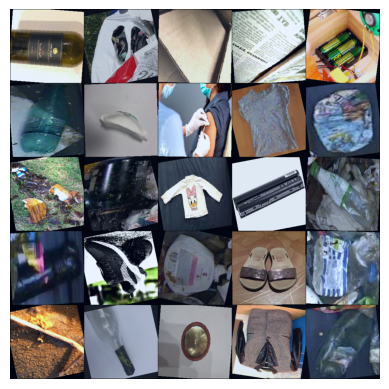

In [36]:
dataiter = iter(train_loader_s2)
images, labels, sources, type_images = next(dataiter)
plt.imshow(np.transpose(torchvision.utils.make_grid(
    images[:25], normalize=True, padding=1, nrow=5).numpy(), (1, 2, 0)))
plt.axis('off')
plt.show()

In [20]:
# Get one batch
images, labels, sources, type_images = next(iter(train_loader_s1))

print(images.shape)   # (batch, 3, 224, 224)

torch.Size([32, 3, 224, 224])


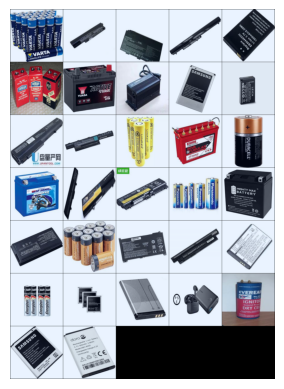

In [37]:
dataiter = iter(val_loader_s2)
images, labels , sources, type_images= next(dataiter)
plt.imshow(np.transpose(torchvision.utils.make_grid(
    images[:32], normalize=True, padding=1, nrow=5).numpy(), (1, 2, 0)))
plt.axis('off')
plt.show()

In [38]:
train_df["type"].value_counts()

type
clean         14767
real_world    10832
Name: count, dtype: int64

In [39]:
device = torch.device("mps")

In [40]:
print("MPS available:", torch.backends.mps.is_available())
print("MPS built:", torch.backends.mps.is_built())

MPS available: True
MPS built: True


### Building the CNN architecture - ResNet34

In [41]:
from torchvision.models import resnet34, ResNet34_Weights
class CNN_stage1_r34(torch.nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(CNN_stage1_r34, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.network = resnet34(weights=ResNet34_Weights.DEFAULT)

        num_features = self.network.fc.in_features
        self.network.fc = torch.nn.Linear(num_features, 13)

    def forward(self, x):
        return self.network(x)

    def freeze(self):

        # Freeze all layers
        for param in self.network.parameters():
            param.requires_grad = False

        # Unfreeze final classifier layer
        for param in self.network.fc.parameters():
            param.requires_grad = True

    def unfreeze(self):

        for param in self.network.parameters():
            param.requires_grad = True

In [42]:
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device("mps")
model = CNN_stage1_r34(13).to(device)

model.freeze()   

learning_rate = 0.001

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=learning_rate
)

criterion = torch.nn.CrossEntropyLoss()
num_epochs = 5
batch_size = 32

In [43]:
torch.backends.mps.is_available()

True

In [52]:
import time

start = time.time()

for i, (imgs, labels, sources, type_images) in enumerate(train_loader_s1):
    if i == 50:
        break

print("50 batches time:", time.time() - start)

50 batches time: 5.912795305252075


In [53]:
epoch_time = (5.912795305252075/ 50) * 1479
epoch_time

174.90048512935638

In [28]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 21285698


In [29]:
print(model)

CNN_stage1_r34(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

In [30]:
print("MPS available:", torch.backends.mps.is_available())
print("MPS built:", torch.backends.mps.is_built())

MPS available: True
MPS built: True


In [31]:
print(next(model.parameters()).device)

mps:0


In [44]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import matthews_corrcoef

In [47]:
# Training loop
epoch_times = []
train_acc_list = []
train_loss_list = []
val_acc_list = []
val_loss_list= []
for epoch in range(num_epochs):
    start = time.time()
    model.train()
    running_loss = 0.0
    train_loss = 0.0
    train_accuracy = 0.0
    all_predictions = []
    all_labels = []
    for images, labels, sources, type_images in train_loader_s2:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Average loss and accuracy
    train_loss = running_loss / len(train_loader_s2)
    train_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    train_loss_list.append(train_loss)
    train_acc_list.append(train_accuracy)
        
    end = time.time()
    epoch_time = end - start
    epoch_times.append(epoch_time)

    print(f"Epoch {epoch+1} time: {epoch_time:.2f} sec")
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.4f}')
    

    model.eval()
    all_predictions = []
    all_labels = []
    running_loss = 0.0
    val_loss = 0.0
    val_accuracy = 0.0
    with torch.no_grad():
        for images, labels, sources, type_images in val_loader_s2:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss = running_loss / len(val_loader_s2)
    val_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    val_loss_list.append(val_loss)
    val_acc_list.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Accuracy: {val_accuracy:.4f}')
    print('-----------------------------')

total_time = sum(epoch_times)
print(f"Total training time: {total_time/60:.2f} minutes")


/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1 time: 169.01 sec
Epoch [1/5], Training Loss: 0.6983
Epoch [1/5], Training Accuracy: 77.5538
Epoch [1/5], Validation Loss: 0.6308
Epoch [1/5], Validation Accuracy: 78.9243
-----------------------------
Epoch 2 time: 169.33 sec
Epoch [2/5], Training Loss: 0.6621
Epoch [2/5], Training Accuracy: 78.2999
Epoch [2/5], Validation Loss: 0.5752
Epoch [2/5], Validation Accuracy: 80.6746
-----------------------------
Epoch 3 time: 169.44 sec
Epoch [3/5], Training Loss: 0.6444
Epoch [3/5], Training Accuracy: 78.9445
Epoch [3/5], Validation Loss: 0.5742
Epoch [3/5], Validation Accuracy: 80.8022
-----------------------------
Epoch 4 time: 171.75 sec
Epoch [4/5], Training Loss: 0.6386
Epoch [4/5], Training Accuracy: 79.2062
Epoch [4/5], Validation Loss: 0.5821
Epoch [4/5], Validation Accuracy: 80.4011
-----------------------------
Epoch 5 time: 174.20 sec
Epoch [5/5], Training Loss: 0.6196
Epoch [5/5], Training Accuracy: 79.3195
Epoch [5/5], Validation Loss: 0.5929
Epoch [5/5], Validation Acc

In [50]:
# Validation
model.eval()
all_predictions = []
all_labels = []
start = time.time()
with torch.no_grad():
    for images, labels, sources, type_images in val_loader_s2:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

end = time.time()
num_images= len(val_loader_s2.dataset)
avg_time = (end - start) / num_images
throughput = num_images / (end - start)

print(f"Inference time per image: {avg_time*1000:.2f} ms")
print(f"Throughput: {throughput:.2f} images/sec")

# Calculate metrics
accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')
balanced_acccuracy=100 * balanced_accuracy_score(all_labels, all_predictions)
mcc = matthews_corrcoef(all_labels, all_predictions)


print(f'Accuracy on test set: {accuracy:.2f}%')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Balanced Accuracy on test set: {balanced_acccuracy:.2f}%')
print(f'MCC is: {mcc:.2f}')

/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Inference time per image: 5.61 ms
Throughput: 178.25 images/sec
Accuracy on test set: 80.88%
Precision: 0.8191
Recall: 0.8088
F1 Score: 0.8054
Balanced Accuracy on test set: 77.43%
MCC is: 0.78


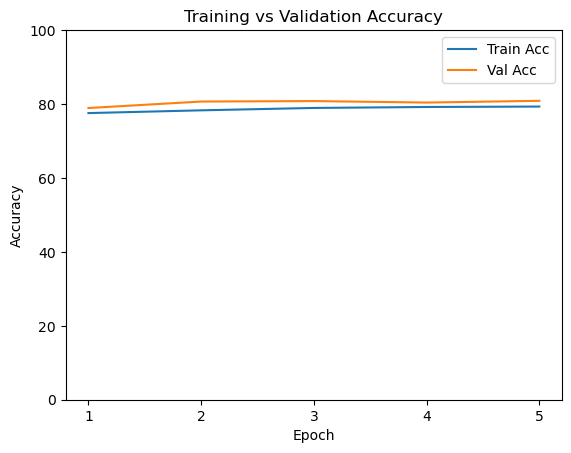

In [51]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Accuracy')
plt.plot(epochs,train_acc_list, label="Train Acc")
plt.plot(epochs,val_acc_list, label="Val Acc")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epochs)
plt.ylim(0, 100)
plt.legend()
plt.show()

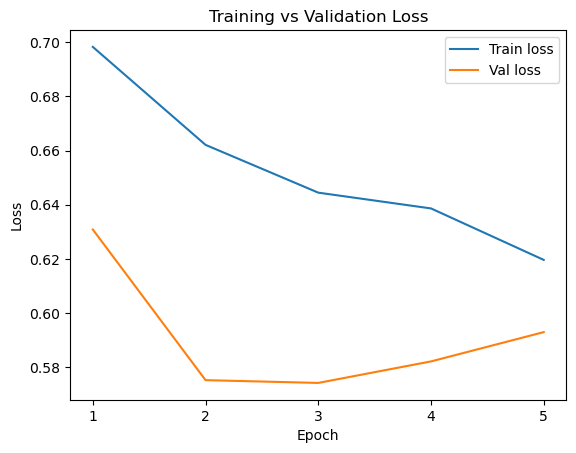

In [52]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Loss')
plt.plot(epochs,train_loss_list, label="Train loss")
plt.plot(epochs,val_loss_list, label="Val loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epochs)
plt.legend()
plt.show()

              precision    recall  f1-score   support

           0       0.83      0.88      0.85       142
           1       0.81      0.75      0.78       139
           2       0.76      0.66      0.71       407
           3       0.76      0.91      0.83       360
           4       0.79      0.76      0.77       145
           5       0.72      0.89      0.80       257
           6       0.60      0.81      0.69       432
           7       0.70      0.50      0.58       225
           8       0.95      0.50      0.65       333
           9       0.86      0.83      0.85      1655
          10       0.79      0.99      0.88       311
          11       0.96      0.96      0.96       830
          12       0.72      0.62      0.67       249

    accuracy                           0.81      5485
   macro avg       0.79      0.77      0.77      5485
weighted avg       0.82      0.81      0.81      5485



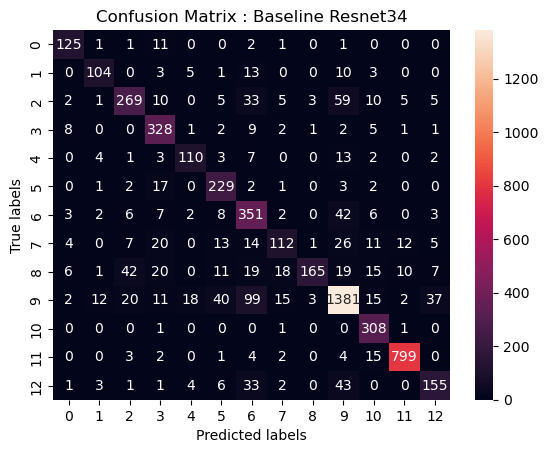

In [55]:
cm = confusion_matrix(all_labels, all_predictions)
print(classification_report(all_labels, all_predictions))

ax= plt.subplot()
class_names = val_ds_stage1.classes
sns.heatmap(cm, annot=True, fmt='g', ax=ax,xticklabels=class_names,
            yticklabels=class_names);

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix : Baseline Resnet34'); 
#ax.xaxis.set_ticklabels(['Organic', 'Non-Organic']); ax.yaxis.set_ticklabels(['Organic', 'Non-Organic'])

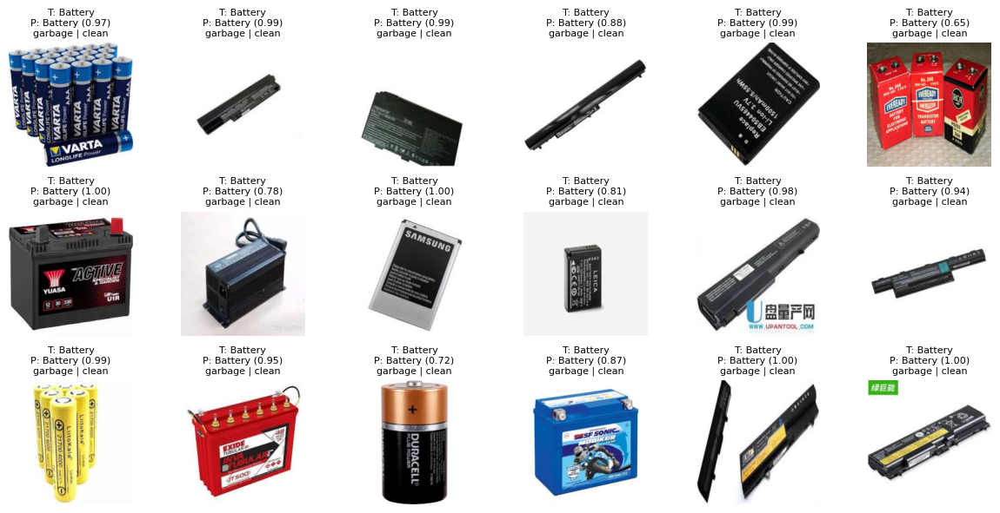

In [56]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img
    
images, labels, sources, type_images = next(iter(val_loader_s2))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model(images)

    probs = torch.softmax(outputs, dim=1)
    confs, preds = torch.max(probs, dim=1)

class_names = val_ds_stage2.classes

fig, axes = plt.subplots(3, 6, figsize=(12, 6))

for i, ax in enumerate(axes.flatten()):

    img = denormalize(images[i])
    true_label = class_names[labels[i]]
    pred_label = class_names[preds[i]]
    conf = confs[i].item()

    src = sources[i]
    type_image = type_images[i]

    ax.imshow(img)
    ax.set_title(
        f"T: {true_label}\nP: {pred_label} ({conf:.2f})\n"
        f"{src} | {type_image}",fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [41]:
print(model)

CNN_stage1_r34(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

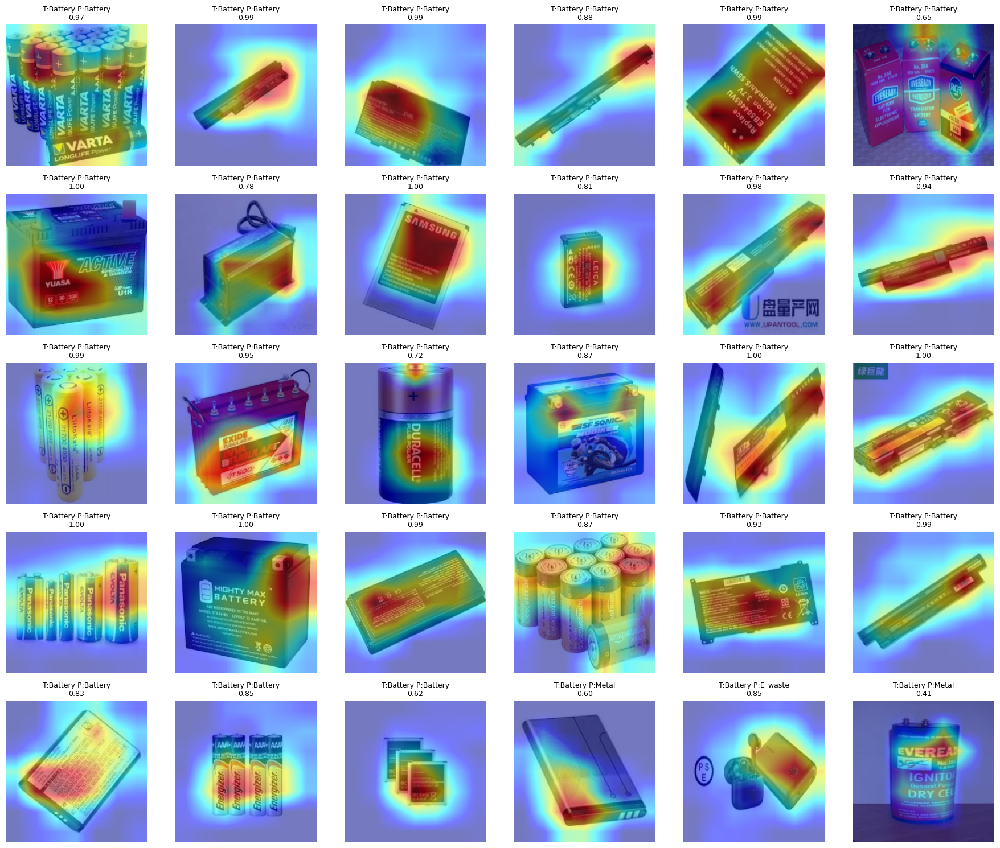

In [57]:
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

device = torch.device("mps")

model.to(device)
model.eval()

target_layers = [model.network.layer4[-1]]

for p in model.network.layer4.parameters():
    p.requires_grad = True

cam = GradCAM(
    model=model,
    target_layers=target_layers
)

# ---- Get ONE validation batch ----
images, labels, sources, type_images = next(iter(val_loader_s2))

images = images.to(device)

class_names = val_ds_stage2.classes

# Forward pass
outputs = model(images)
probs = torch.softmax(outputs, dim=1)
preds = torch.argmax(probs, dim=1)

targets = [ClassifierOutputTarget(p.item()) for p in preds]

grayscale_cams = cam(
    input_tensor=images,
    targets=targets
)

batch_size = images.size(0)

# ---- Grid settings ----
rows = 5
cols = 6
max_images = rows * cols

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(min(max_images, images.size(0))):

    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1,2,0).numpy()

    # Normalize for display (edit if using mean/std)
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    heatmap = grayscale_cams[i]

    visualization = show_cam_on_image(
        img_np,
        heatmap,
        use_rgb=True
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(visualization)

    gt = labels[i].item()
    pred = preds[i].item()
    gt_lab = class_names[labels[i]]
    pred_lab = class_names[preds[i]]
    conf = probs[i][pred].item()

    plt.title(f"T:{gt_lab} P:{pred_lab}\n{conf:.2f}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()


### Building the CNN architecture - MobilenetV2

In [58]:
from torchvision.models import mobilenet_v2, MobileNet_V2_Weights
class CNN_stage1_mnv2(torch.nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(CNN_stage1_mnv2, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.network = mobilenet_v2(weights=MobileNet_V2_Weights.DEFAULT)

        num_features = self.network.classifier[1].in_features
        self.network.classifier[1] = torch.nn.Linear(num_features, 13)

    def forward(self, x):
        return self.network(x)

    def freeze(self):

        # Freeze all layers
        for param in self.network.parameters():
            param.requires_grad = False

        # Unfreeze final classifier layer
        for param in self.network.classifier.parameters():
            param.requires_grad = True

    def unfreeze(self):

        for param in self.network.parameters():
            param.requires_grad = True

In [59]:
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device("mps")
model_mnv2 = CNN_stage1_mnv2(13).to(device)

model_mnv2.freeze()   

learning_rate = 0.001

optimizer = torch.optim.Adam(
    model_mnv2.parameters(),
    lr=learning_rate
)

criterion = torch.nn.CrossEntropyLoss()
num_epochs = 5
batch_size = 32

In [60]:
total_params = sum(p.numel() for p in model_mnv2.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 2240525


In [143]:
import time

start = time.time()

for i, (imgs, labels, sources, type_images) in enumerate(train_loader_s1):
    if i == 50:
        break

print("50 batches time:", time.time() - start)

50 batches time: 4.613411903381348


In [61]:
# Training loop
epoch_times = []
train_acc_list = []
train_loss_list = []
val_acc_list = []
val_loss_list= []
for epoch in range(num_epochs):
    start = time.time()
    model_mnv2.train()
    running_loss = 0.0
    train_loss = 0.0
    train_accuracy = 0.0
    all_predictions = []
    all_labels = []
    for images, labels, sources, type_images in train_loader_s2:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_mnv2(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Average loss and accuracy
    train_loss = running_loss / len(train_loader_s2)
    train_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    train_loss_list.append(train_loss)
    train_acc_list.append(train_accuracy)
        
    end = time.time()
    epoch_time = end - start
    epoch_times.append(epoch_time)

    print(f"Epoch {epoch+1} time: {epoch_time:.2f} sec")
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.4f}')
    

    model_mnv2.eval()
    all_predictions = []
    all_labels = []
    running_loss = 0.0
    val_loss = 0.0
    val_accuracy = 0.0
    with torch.no_grad():
        for images, labels, sources, type_images in val_loader_s2:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_mnv2(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss = running_loss / len(val_loader_s2)
    val_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    val_loss_list.append(val_loss)
    val_acc_list.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Accuracy: {val_accuracy:.4f}')
    print('-----------------------------')

total_time = sum(epoch_times)
print(f"Total training time: {total_time/60:.2f} minutes")


/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1 time: 155.85 sec
Epoch [1/5], Training Loss: 0.9044
Epoch [1/5], Training Accuracy: 73.8271
Epoch [1/5], Validation Loss: 0.5908
Epoch [1/5], Validation Accuracy: 82.5889
-----------------------------
Epoch 2 time: 154.72 sec
Epoch [2/5], Training Loss: 0.6469
Epoch [2/5], Training Accuracy: 79.3234
Epoch [2/5], Validation Loss: 0.5121
Epoch [2/5], Validation Accuracy: 84.2662
-----------------------------
Epoch 3 time: 153.97 sec
Epoch [3/5], Training Loss: 0.5986
Epoch [3/5], Training Accuracy: 80.8078
Epoch [3/5], Validation Loss: 0.4752
Epoch [3/5], Validation Accuracy: 85.1960
-----------------------------
Epoch 4 time: 155.94 sec
Epoch [4/5], Training Loss: 0.5807
Epoch [4/5], Training Accuracy: 81.3938
Epoch [4/5], Validation Loss: 0.4525
Epoch [4/5], Validation Accuracy: 85.9617
-----------------------------
Epoch 5 time: 149.33 sec
Epoch [5/5], Training Loss: 0.5589
Epoch [5/5], Training Accuracy: 81.7571
Epoch [5/5], Validation Loss: 0.4588
Epoch [5/5], Validation Acc

In [62]:
# Validation
model_mnv2.eval()
all_predictions = []
all_labels = []
start = time.time()
with torch.no_grad():
    for images, labels, sources, type_images in val_loader_s2:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_mnv2(images)
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

end = time.time()
num_images= len(val_loader_s2.dataset)
avg_time = (end - start) / num_images
throughput = num_images / (end - start)

print(f"Inference time per image: {avg_time*1000:.2f} ms")
print(f"Throughput: {throughput:.2f} images/sec")

# Calculate metrics
accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')
balanced_acccuracy=100 * balanced_accuracy_score(all_labels, all_predictions)
mcc = matthews_corrcoef(all_labels, all_predictions)


print(f'Accuracy on test set: {accuracy:.2f}%')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Balanced Accuracy on test set: {balanced_acccuracy:.2f}%')
print(f'MCC is: {mcc:.2f}')
print('-----------------------------')

/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Inference time per image: 4.59 ms
Throughput: 218.03 images/sec
Accuracy on test set: 85.14%
Precision: 0.8556
Recall: 0.8514
F1 Score: 0.8490
Balanced Accuracy on test set: 81.06%
MCC is: 0.83
-----------------------------


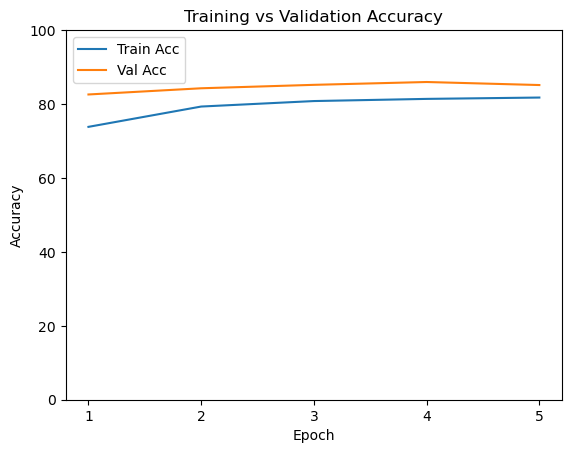

In [63]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Accuracy')
plt.plot(epochs,train_acc_list, label="Train Acc")
plt.plot(epochs,val_acc_list, label="Val Acc")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epochs)
plt.ylim(0, 100)
plt.legend()
plt.show()

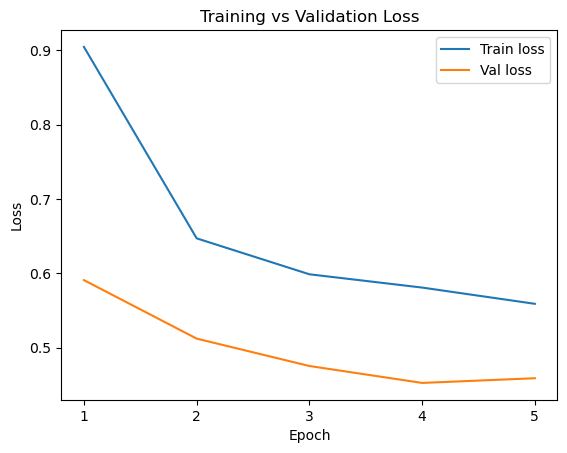

In [64]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Loss')
plt.plot(epochs,train_loss_list, label="Train loss")
plt.plot(epochs,val_loss_list, label="Val loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epochs)
plt.legend()
plt.show()

              precision    recall  f1-score   support

           0       0.87      0.92      0.89       142
           1       0.90      0.74      0.81       139
           2       0.88      0.64      0.74       407
           3       0.89      0.89      0.89       360
           4       0.81      0.72      0.77       145
           5       0.92      0.89      0.90       257
           6       0.66      0.81      0.73       432
           7       0.80      0.66      0.72       225
           8       0.87      0.85      0.86       333
           9       0.83      0.90      0.86      1655
          10       0.86      0.98      0.92       311
          11       0.97      0.97      0.97       830
          12       0.84      0.56      0.67       249

    accuracy                           0.85      5485
   macro avg       0.85      0.81      0.83      5485
weighted avg       0.86      0.85      0.85      5485



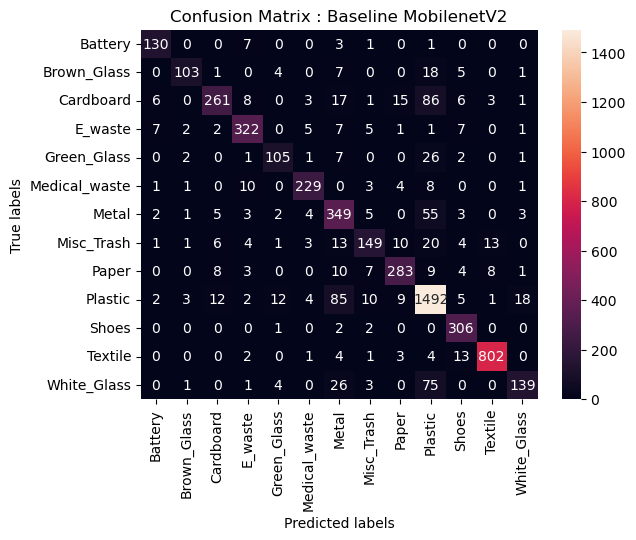

In [69]:
cm = confusion_matrix(all_labels, all_predictions)
print(classification_report(all_labels, all_predictions))


class_names = val_ds_stage2.classes
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax,xticklabels=class_names,
            yticklabels=class_names);

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix : Baseline MobilenetV2'); 
#ax.xaxis.set_ticklabels(['Organic', 'Non-Organic']); ax.yaxis.set_ticklabels(['Organic', 'Non-Organic'])

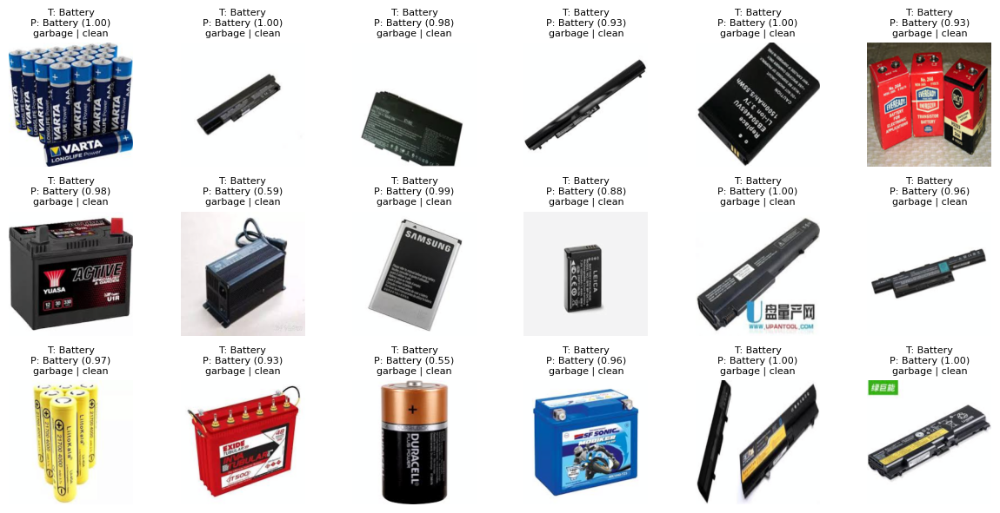

In [67]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img
    
images, labels, sources, type_images = next(iter(val_loader_s2))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model_mnv2(images)

    probs = torch.softmax(outputs, dim=1)
    confs, preds = torch.max(probs, dim=1)

class_names = val_ds_stage2.classes

fig, axes = plt.subplots(3, 6, figsize=(12, 6))

for i, ax in enumerate(axes.flatten()):

    img = denormalize(images[i])
    true_label = class_names[labels[i]]
    pred_label = class_names[preds[i]]
    conf = confs[i].item()

    src = sources[i]
    type_image = type_images[i]

    ax.imshow(img)
    ax.set_title(
        f"T: {true_label}\nP: {pred_label} ({conf:.2f})\n"
        f"{src} | {type_image}",fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [52]:
print(model_mnv2)

CNN_stage1_mnv2(
  (network): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_siz

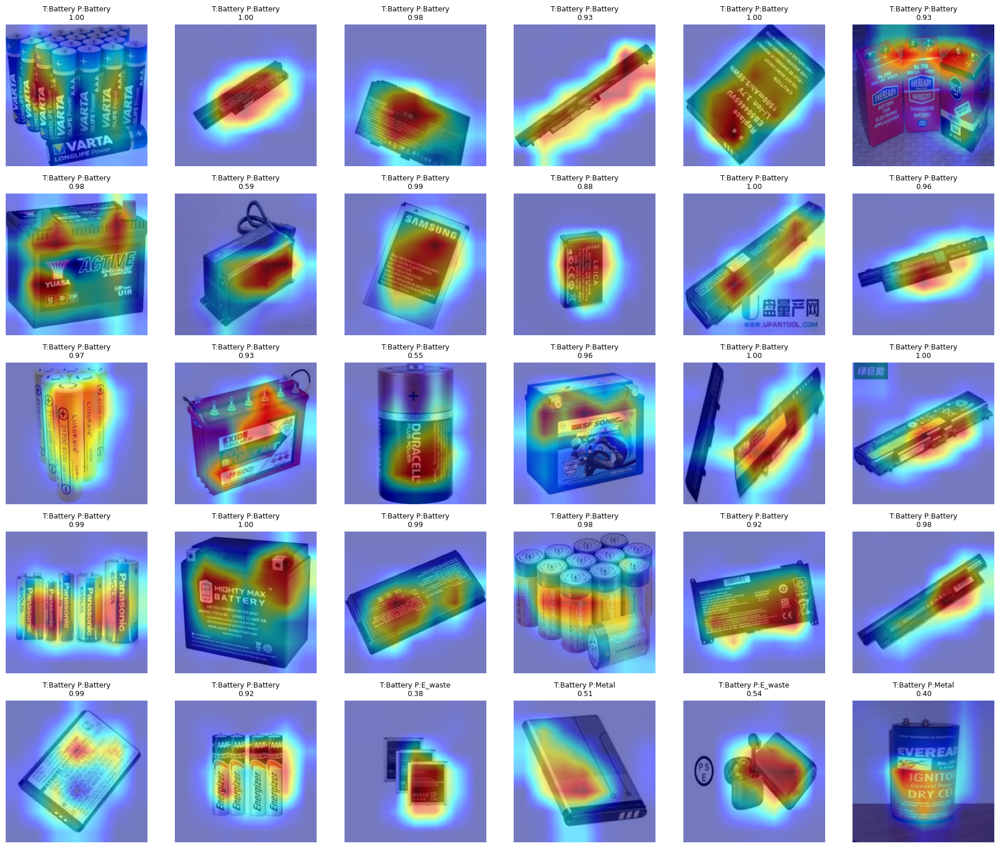

In [68]:
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

device = torch.device("mps")

model_mnv2.to(device)
model_mnv2.eval()

target_layers = [model_mnv2.network.features[-1]]

for p in model_mnv2.network.features[-1].parameters():
    p.requires_grad = True

cam = GradCAM(
    model=model_mnv2,
    target_layers=target_layers
)

# ---- Get ONE validation batch ----
images, labels, sources, type_images = next(iter(val_loader_s2))

images = images.to(device)

class_names = val_ds_stage2.classes

# Forward pass
outputs = model_mnv2(images)
probs = torch.softmax(outputs, dim=1)
preds = torch.argmax(probs, dim=1)

targets = [ClassifierOutputTarget(p.item()) for p in preds]

grayscale_cams = cam(
    input_tensor=images,
    targets=targets
)

batch_size = images.size(0)

# ---- Grid settings ----
rows = 5
cols = 6
max_images = rows * cols

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(min(max_images, images.size(0))):

    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1,2,0).numpy()

    # Normalize for display (edit if using mean/std)
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    heatmap = grayscale_cams[i]

    visualization = show_cam_on_image(
        img_np,
        heatmap,
        use_rgb=True
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(visualization)

    gt = labels[i].item()
    pred = preds[i].item()
    gt_lab = class_names[labels[i]]
    pred_lab = class_names[preds[i]]
    conf = probs[i][pred].item()

    plt.title(f"T:{gt_lab} P:{pred_lab}\n{conf:.2f}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()


### Building the CNN architecture - Densenet-121

In [70]:
from torchvision.models import densenet121, DenseNet121_Weights
class CNN_stage1_dn121(torch.nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(CNN_stage1_dn121, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.network = densenet121(weights=DenseNet121_Weights.DEFAULT)

        num_features = self.network.classifier.in_features
        self.network.classifier = torch.nn.Linear(num_features, 13)

    def forward(self, x):
        return self.network(x)

    def freeze(self):

        # Freeze all layers
        for param in self.network.parameters():
            param.requires_grad = False

        # Unfreeze final classifier layer
        for param in self.network.classifier.parameters():
            param.requires_grad = True

    def unfreeze(self):

        for param in self.network.parameters():
            param.requires_grad = True

In [71]:
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device("mps")
model_dn121 = CNN_stage1_dn121(13).to(device)

model_dn121.freeze()   

learning_rate = 0.001

optimizer = torch.optim.Adam(
    model_dn121.parameters(),
    lr=learning_rate
)

criterion = torch.nn.CrossEntropyLoss()
num_epochs = 5
batch_size = 32

In [72]:
total_params = sum(p.numel() for p in model_dn121.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 6967181


In [57]:
import time

start = time.time()

for i, (imgs, labels, sources, type_images) in enumerate(train_loader_s1):
    if i == 50:
        break

print("50 batches time:", time.time() - start)

50 batches time: 5.590678930282593


In [73]:
# Training loop
epoch_times = []
train_acc_list = []
train_loss_list = []
val_acc_list = []
val_loss_list= []
for epoch in range(num_epochs):
    start = time.time()
    model_dn121.train()
    running_loss = 0.0
    train_loss = 0.0
    train_accuracy = 0.0
    all_predictions = []
    all_labels = []
    for images, labels, sources, type_images in train_loader_s2:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_dn121(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Average loss and accuracy
    train_loss = running_loss / len(train_loader_s2)
    train_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    train_loss_list.append(train_loss)
    train_acc_list.append(train_accuracy)
        
    end = time.time()
    epoch_time = end - start
    epoch_times.append(epoch_time)

    print(f"Epoch {epoch+1} time: {epoch_time:.2f} sec")
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.4f}')
    

    model_dn121.eval()
    all_predictions = []
    all_labels = []
    running_loss = 0.0
    val_loss = 0.0
    val_accuracy = 0.0
    with torch.no_grad():
        for images, labels, sources, type_images in val_loader_s2:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_dn121(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss = running_loss / len(val_loader_s2)
    val_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    val_loss_list.append(val_loss)
    val_acc_list.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Accuracy: {val_accuracy:.4f}')
    print('-----------------------------')

total_time = sum(epoch_times)
print(f"Total training time: {total_time/60:.2f} minutes")


/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1 time: 233.20 sec
Epoch [1/5], Training Loss: 0.8957
Epoch [1/5], Training Accuracy: 72.9872
Epoch [1/5], Validation Loss: 0.5951
Epoch [1/5], Validation Accuracy: 82.0419
-----------------------------
Epoch 2 time: 231.25 sec
Epoch [2/5], Training Loss: 0.6213
Epoch [2/5], Training Accuracy: 79.9406
Epoch [2/5], Validation Loss: 0.5101
Epoch [2/5], Validation Accuracy: 83.5552
-----------------------------
Epoch 3 time: 232.77 sec
Epoch [3/5], Training Loss: 0.5790
Epoch [3/5], Training Accuracy: 81.0071
Epoch [3/5], Validation Loss: 0.5266
Epoch [3/5], Validation Accuracy: 83.3546
-----------------------------
Epoch 4 time: 237.32 sec
Epoch [4/5], Training Loss: 0.5523
Epoch [4/5], Training Accuracy: 81.8391
Epoch [4/5], Validation Loss: 0.5007
Epoch [4/5], Validation Accuracy: 83.8651
-----------------------------
Epoch 5 time: 237.60 sec
Epoch [5/5], Training Loss: 0.5328
Epoch [5/5], Training Accuracy: 82.3313
Epoch [5/5], Validation Loss: 0.4770
Epoch [5/5], Validation Acc

In [74]:
# Validation
model_dn121.eval()
all_predictions = []
all_labels = []
start = time.time()
with torch.no_grad():
    for images, labels, sources, type_images in val_loader_s2:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_dn121(images)
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

end = time.time()
num_images= len(val_loader_s2.dataset)
avg_time = (end - start) / num_images
throughput = num_images / (end - start)

print(f"Inference time per image: {avg_time*1000:.2f} ms")
print(f"Throughput: {throughput:.2f} images/sec")


# Calculate metrics
accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')
balanced_acccuracy=100 * balanced_accuracy_score(all_labels, all_predictions)
mcc = matthews_corrcoef(all_labels, all_predictions)

print(f'Accuracy on test set: {accuracy:.2f}%')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Balanced Accuracy on test set: {balanced_acccuracy:.2f}%')
print(f'MCC is: {mcc:.2f}')
print('-----------------------------')

Inference time per image: 7.38 ms
Throughput: 135.41 images/sec
Accuracy on test set: 84.34%
Precision: 0.8470
Recall: 0.8434
F1 Score: 0.8435
Balanced Accuracy on test set: 82.69%
MCC is: 0.82
-----------------------------


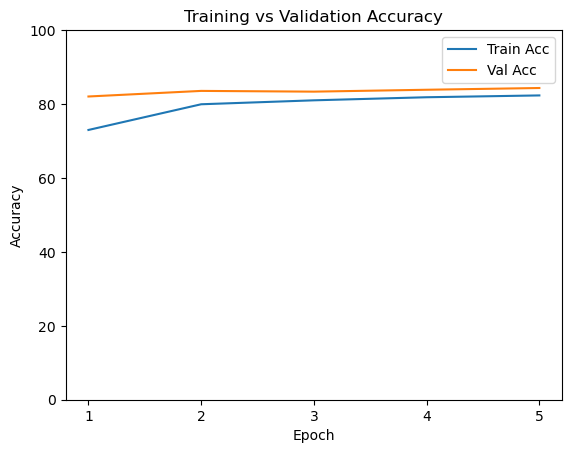

In [75]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Accuracy')
plt.plot(epochs,train_acc_list, label="Train Acc")
plt.plot(epochs,val_acc_list, label="Val Acc")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epochs)
plt.ylim(0, 100)
plt.legend()
plt.show()

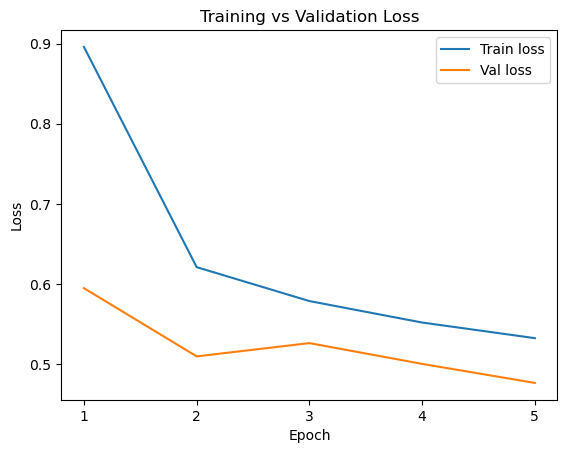

In [76]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Loss')
plt.plot(epochs,train_loss_list, label="Train loss")
plt.plot(epochs,val_loss_list, label="Val loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epochs)
plt.legend()
plt.show()

              precision    recall  f1-score   support

           0       0.89      0.93      0.91       142
           1       0.85      0.76      0.81       139
           2       0.80      0.70      0.75       407
           3       0.89      0.92      0.91       360
           4       0.75      0.81      0.78       145
           5       0.84      0.91      0.88       257
           6       0.64      0.81      0.71       432
           7       0.70      0.70      0.70       225
           8       0.87      0.79      0.83       333
           9       0.87      0.84      0.85      1655
          10       0.88      0.96      0.92       311
          11       0.96      0.96      0.96       830
          12       0.78      0.65      0.71       249

    accuracy                           0.84      5485
   macro avg       0.83      0.83      0.82      5485
weighted avg       0.85      0.84      0.84      5485



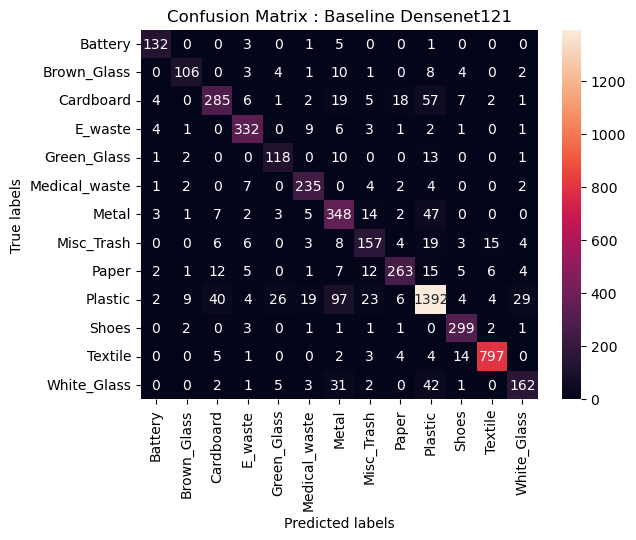

In [82]:
cm = confusion_matrix(all_labels, all_predictions)
print(classification_report(all_labels, all_predictions))

ax= plt.subplot()

class_names = val_ds_stage2.classes
sns.heatmap(cm, annot=True, fmt='g', ax=ax,xticklabels=class_names,
            yticklabels=class_names);

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix : Baseline Densenet121'); 
#ax.xaxis.set_ticklabels(['Organic', 'Non-Organic']); ax.yaxis.set_ticklabels(['Organic', 'Non-Organic'])

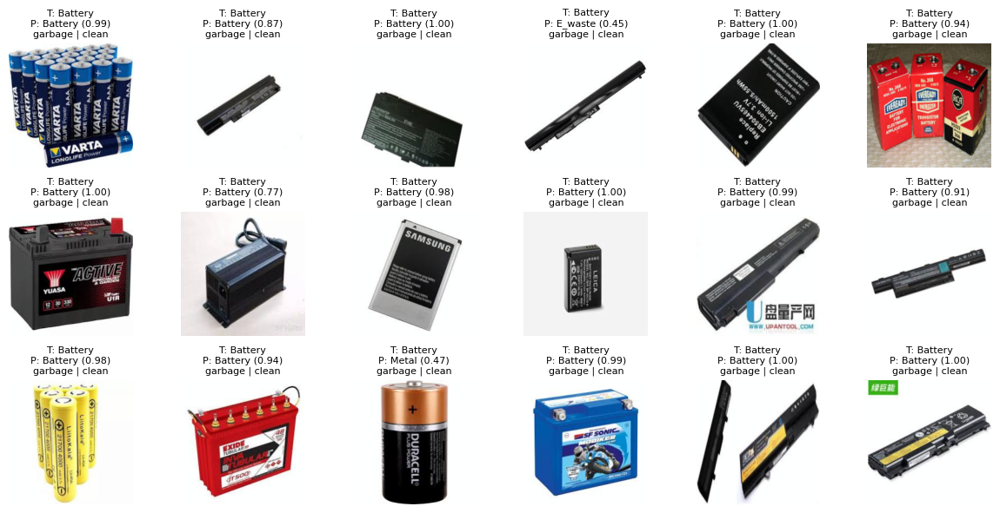

In [80]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img
    
images, labels, sources, type_images = next(iter(val_loader_s2))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model_dn121(images)

    probs = torch.softmax(outputs, dim=1)
    confs, preds = torch.max(probs, dim=1)

class_names = val_ds_stage2.classes

fig, axes = plt.subplots(3, 6, figsize=(12, 6))

for i, ax in enumerate(axes.flatten()):

    img = denormalize(images[i])
    true_label = class_names[labels[i]]
    pred_label = class_names[preds[i]]
    conf = confs[i].item()

    src = sources[i]
    type_image = type_images[i]

    ax.imshow(img)
    ax.set_title(
        f"T: {true_label}\nP: {pred_label} ({conf:.2f})\n"
        f"{src} | {type_image}",fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
print(model_dn121)

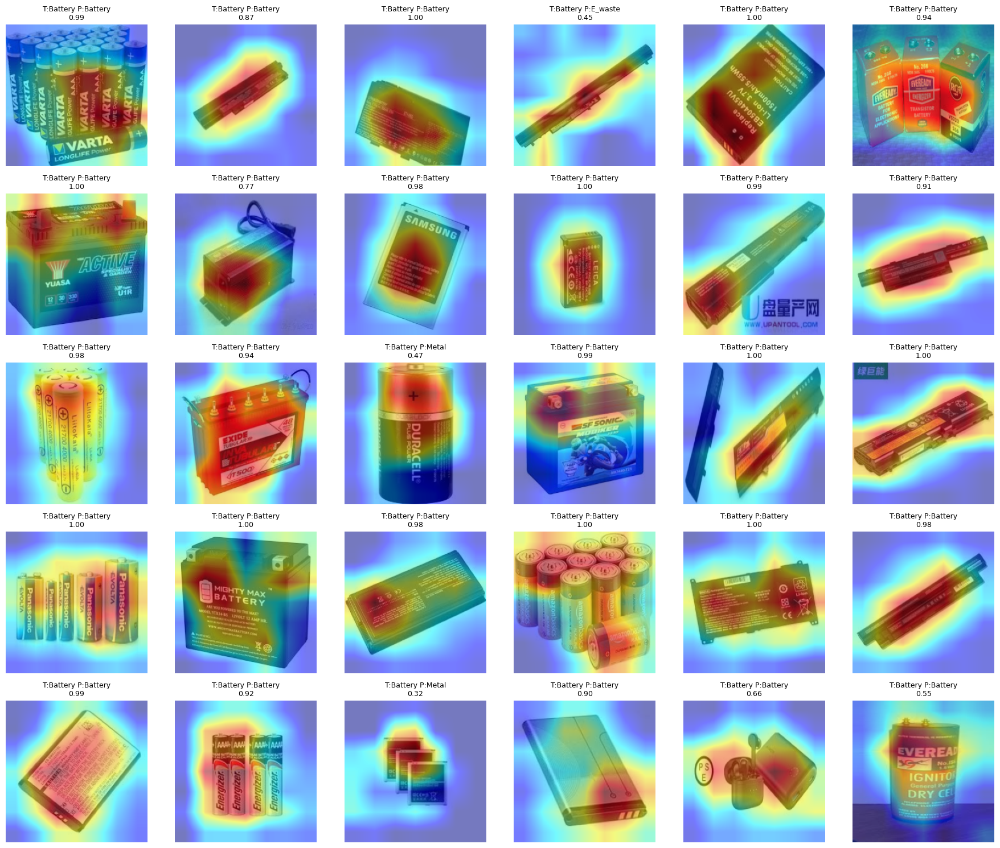

In [81]:
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

device = torch.device("mps")

model_dn121.to(device)
model_dn121.eval()

target_layers = [model_dn121.network.features[-1]]

for p in model_dn121.network.features[-1].parameters():
    p.requires_grad = True

cam = GradCAM(
    model=model_dn121,
    target_layers=target_layers
)

# ---- Get ONE validation batch ----
images, labels, sources, type_images = next(iter(val_loader_s2))

images = images.to(device)

class_names = val_ds_stage2.classes

# Forward pass
outputs = model_dn121(images)
probs = torch.softmax(outputs, dim=1)
preds = torch.argmax(probs, dim=1)

targets = [ClassifierOutputTarget(p.item()) for p in preds]

grayscale_cams = cam(
    input_tensor=images,
    targets=targets
)

batch_size = images.size(0)

# ---- Grid settings ----
rows = 5
cols = 6
max_images = rows * cols

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(min(max_images, images.size(0))):

    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1,2,0).numpy()

    # Normalize for display (edit if using mean/std)
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    heatmap = grayscale_cams[i]

    visualization = show_cam_on_image(
        img_np,
        heatmap,
        use_rgb=True
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(visualization)

    gt = labels[i].item()
    pred = preds[i].item()
    gt_lab = class_names[labels[i]]
    pred_lab = class_names[preds[i]]
    conf = probs[i][pred].item()

    plt.title(f"T:{gt_lab} P:{pred_lab}\n{conf:.2f}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()
